In [1]:
%load_ext autoreload
%autoreload 1

In [2]:
%%writefile hp.py
import numpy
import math

class LayerHP:
  def __init__(self):
    self.input_shape = None
    self.output_shape = (100, 100)
    self.alpha = 0.1   # learning rate
    self.alpha_n = 0.01 # neighbor learning rate

    self.enable_neighborhood_smoothing = True
    self.enable_precision = True
    self.enable_precision_weighted_distance = True
    self.enable_per_neuron_learning_rate = True
    self.enable_retinotopy = True
    self.target_output_usage_factor = 2.0

  @property
  def input_size(self):
    return numpy.prod(self.input_shape)

  @property
  def output_size(self):
    return numpy.prod(self.output_shape)

class DatasetHP:
  def __init__(self):
    self.image_batch_size = 400
    self.kernel_shape = (5, 5)
    self.stride = 1

  @property
  def kernel_size(self):
    return numpy.prod(self.kernel_shape)

  @property
  def patch_grid_shape(self):
    return (
      math.floor(((self.image_shape[0] + 2 * 0 - 1 * (self.kernel_shape[0] - 1) - 1) / self.stride) + 1),
      math.floor(((self.image_shape[0] + 2 * 0 - 1 * (self.kernel_shape[1] - 1) - 1) / self.stride) + 1),
    )

class HP:
  def __init__(self):
    self.mask_contrast = 3


Overwriting hp.py


In [3]:
%%writefile util.py
import torch
import pdb
from hp import HP
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

class Util:
  @staticmethod
  def add_gaussian_noise(tensor, mean=0., std=1.):
    t = tensor + torch.randn(tensor.size()).to(device) * std + mean
    t.to(device)
    return t

  @staticmethod
  def norm_scale(t):
    epsilon = 0.00001

    assert len(t.shape)==2, "t shape must be (batch,size)"
    # print("mean", t.mean())
    # print("std", t.std())
    std = t.std(dim=-1).unsqueeze(-1)
    std[std<epsilon] = epsilon
    t = (t - t.mean(dim=-1).unsqueeze(-1)) / std
    # print("max", t.max())
    # print("min", t.min())
    scale = (t.max(dim=-1)[0] - t.min(dim=-1)[0]).unsqueeze(-1)
    scale[scale<epsilon] = epsilon
    t = t / scale

    t = t - t.min(dim=-1)[0].unsqueeze(-1)
    # print("max", t.max())
    # print("min", t.min())

    return t

  @staticmethod
  def conv_slice(images, kernel_shape, stride):
    assert len(images.shape) == 3, "Must be (image count, image height, image width)"
    images = images.unsqueeze(1)

    fold_params = dict(kernel_size=kernel_shape, dilation=1, padding=0, stride=stride)
    unfold = torch.nn.Unfold(**fold_params)
    print("images", images.shape)
    unfolded = unfold(images)
    unfolded = unfolded.view(images.shape[0], -1, unfolded.shape[-1])
    unfolded = unfolded.transpose(1, 2)
    return unfolded

  @staticmethod
  def var_to_precision(pattern_var, hp):
    return torch.exp(-pattern_var * hp.mask_contrast)

Overwriting util.py


In [4]:
%%writefile graphics_util.py
import matplotlib.pyplot as plt
import numpy as np
import math
import torch
from util import Util

class GraphicsUtil:
  @staticmethod
  def show_image_grid(images, alpha=None, vmin=0, vmax=1, grid_width=None, grid_height=None):
    assert len(images.shape) == 3, "Must be (image count, image height, image width)"
    (image_count, image_height, image_width) = images.shape

    if alpha is not None:
      assert images.shape == alpha.shape

    if grid_width is None or grid_height is None:
      image_grid_size = math.floor(image_count ** 0.5)
      if image_grid_size > 15:
        image_grid_size = 15

      images = images[0:image_grid_size*image_grid_size]
      if alpha is not None:
        alpha = alpha[0:image_grid_size*image_grid_size]

      grid_width = image_grid_size
      grid_height = image_grid_size
    else:
      assert grid_width * grid_height == image_count

    gutter_size = 2
    composite_image = torch.zeros(((image_height + gutter_size) * grid_height - gutter_size, (image_width + gutter_size) * grid_width - gutter_size))
    if alpha is not None:
      composite_alpha = torch.ones_like(composite_image)

    for row in range(grid_height):
      for col in range(grid_width):
        r1 = row * (image_height + gutter_size)
        r2 = r1 + image_height
        c1 = col * (image_width + gutter_size)
        c2 = c1 + image_width
        index = row * grid_height + col
        composite_image[r1:r2, c1:c2] = images[index] 
        if alpha is not None:
          composite_alpha[r1:r2, c1:c2] = alpha[index] 

    if alpha is None:
      composite_alpha = None

    plt.figure(figsize=(grid_height * 0.7, grid_width * 0.7))
    plt.imshow(composite_image.cpu().numpy(), alpha=composite_alpha, vmin=vmin, vmax=vmax, interpolation='none', cmap=plt.cm.viridis)
    plt.axis('off')
    plt.show()



Overwriting graphics_util.py


In [5]:
%%writefile dataset_loader.py
from util import Util
from graphics_util import GraphicsUtil
import math
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

def load_mnist(train=True, batch_size=64):
  kwargs = {'num_workers': 1, 'pin_memory': True} if device=="cuda" else {}
  loader = torch.utils.data.DataLoader(
    datasets.MNIST('./data', train=train, download=True,
                   transform=transforms.Compose([
                       transforms.ToTensor(),
                   ])),
    batch_size=batch_size, shuffle=True, **kwargs)
  
  return loader

def load_cifar10(train=True, batch_size=64):
  kwargs = {'num_workers': 1, 'pin_memory': True} if device=="cuda" else {}
  loader = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data', train=train, download=True,
                   transform=transforms.Compose([
                       transforms.ToTensor(),
                   ])),
    batch_size=batch_size, shuffle=True, **kwargs)
  
  return loader

def load_imagefolder(batch_size=64):
  loader = torch.utils.data.DataLoader(
      datasets.ImageFolder('/content/drive/My Drive/work/datasets/digit',
                   transform=transforms.Compose([
                       transforms.ToTensor(),
                   ])),
    batch_size=batch_size, shuffle=True)
  
  return loader

def load_dataset(config):
  images = next(iter(load_mnist(batch_size=config.image_batch_size)))[0]
  # plt.imshow(images[0].permute(1,2,0))
  # plt.show()
  images = images[:,0,:,:].unsqueeze(1)
  ib, ic, ih, iw = images.shape
  config.image_shape = (ih, iw)
  print("images", images.shape)
  images = images.view(ib*ic, ih, iw)
  print("images", images.shape)

  plt.imshow(images[0], vmin=0, vmax=1)
  plt.show()

  patches = Util.conv_slice(images, kernel_shape=config.kernel_shape, stride=config.stride)
  print("patches", patches.shape)
  patch_grid_shape = config.patch_grid_shape
  print("patch_grid_shape", patch_grid_shape)
  assert patch_grid_shape[0] * patch_grid_shape[1] == patches.shape[1]

  GraphicsUtil.show_image_grid(patches.reshape(-1, config.kernel_shape[0], config.kernel_shape[0]))

  dataset = torch.utils.data.TensorDataset(patches.to(device))
  
  loader = torch.utils.data.DataLoader(dataset, batch_size=1, pin_memory=False)
  return loader, images, patch_grid_shape

Overwriting dataset_loader.py


images torch.Size([400, 1, 28, 28])
images torch.Size([400, 28, 28])


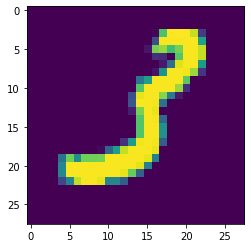

images torch.Size([400, 1, 28, 28])
patches torch.Size([400, 576, 25])
patch_grid_shape (24, 24)


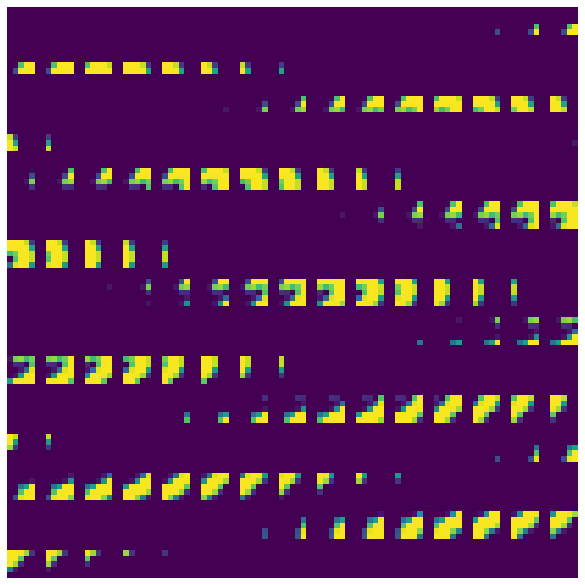

In [6]:
%aimport hp
%aimport util
%aimport graphics_util
%aimport dataset_loader

from hp import DatasetHP
from dataset_loader import load_dataset
from graphics_util import GraphicsUtil

dataset_hp = DatasetHP()
original_dataset, original_images, patch_grid_shape = dataset_loader.load_dataset(dataset_hp)
# GraphicsUtil.show_image_grid(original_dataset.dataset.tensors[0][100:200].view(-1, HP.image_height, HP.image_width), vmin=0, vmax=1)

In [7]:
%%writefile som_layer.py
from util import Util
from graphics_util import GraphicsUtil
import math
import matplotlib.pyplot as plt
import torch
import pdb
from hp import LayerHP
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

class SOMLayer(torch.nn.Module):
  def __init__(self, hp:LayerHP):
    super().__init__()
    self.hp = hp
    self.weights = torch.rand((self.hp.output_size, self.hp.input_size)).to(device) * 0.01
    self.alpha_i = torch.ones((self.hp.output_size,)).to(device)
    self.variance = torch.ones_like(self.weights).to(device)
    self.precision = None
    self.precision = self.get_precision(self.variance)

    self.show_weights()

  def get_precision(self, variance):
    return torch.exp(-variance * 3)

  def l2_distance(self, x, x_precision, y, y_precision):
    xs = x.shape
    assert len(xs) == 2
    assert (x_precision is None) or (x_precision.shape == xs), "Precision, if specified, must be same shape as patterns"

    ys = y.shape
    assert len(ys) == 2
    assert (y_precision is None) or (y_precision.shape == ys), "Precision, if specified, must be same shape as patterns"

    assert xs[1] == ys[1], "Patch size, i.e. dim 1, must match"

    n = xs[0]
    m = ys[0]
    d = xs[1]

    x = x.unsqueeze(1).expand(n, m, d)
    y = y.unsqueeze(0).expand(n, m, d)

    dist_1 = (x - y).abs()
    dist_d = torch.pow(dist_1, 2)

    if self.hp.enable_precision_weighted_distance:
      if x_precision is not None:
        dist_d = dist_d * x_precision.unsqueeze(1).expand(n, m, d)

      if y_precision is not None:
        dist_d = dist_d * y_precision.unsqueeze(0).expand(n, m, d)

    dist = dist_d.sum(2).sqrt()
    return dist_1, dist_d, dist

  def similarity(self, x, x_precision, y, y_precision):
    dist_1, dist_d, dist = self.l2_distance(x=x, x_precision=x_precision, y=y, y_precision=y_precision)
    sim = torch.exp(-dist)
    return dist_1, dist_d, dist, sim

  def forward(self, x):
    if self.hp.enable_retinotopy:
      output = torch.zeros(self.hp.output_shape) # 2D
    else:
      output = torch.zeros(self.hp.output_size)  # 1D

    dist_1, dist_d, dist, sim = self.similarity(x=x, x_precision=None, y=self.weights, y_precision=self.precision)
    if not self.hp.enable_retinotopy:
      sim_max = sim.max(dim=1)
      winner_indexes = sim_max[1]

    alpha = self.hp.alpha * self.alpha_i

    if self.hp.enable_retinotopy:
      g = [self.hp.output_shape[i] - self.hp.retinotopic_local_grid_shape[i] for i in range(len(self.hp.output_shape))]

    for i in range(x.shape[0]):
      # Winner learning
      if self.hp.enable_retinotopy:
        ih = math.floor(i / self.hp.patch_grid_shape[0])
        iw = i % self.hp.patch_grid_shape[0]
        p = (int(ih * g[0] / (self.hp.patch_grid_shape[0] - 1)), int(iw * g[1] / (self.hp.patch_grid_shape[1] - 1)))
        q = (p[0]+self.hp.retinotopic_local_grid_shape[0], p[1]+self.hp.retinotopic_local_grid_shape[1])
        # print(f"i={i}, ih={ih}, iw={iw}, p={p}")

        sim_i_2d = sim[i].view(self.hp.output_shape)
        subset_sim_i_2d = sim_i_2d[p[0]:q[0], p[1]:q[1]]
        subset_sim_i_1d = subset_sim_i_2d.reshape(-1)
        wi_subset_sim_i_1d = subset_sim_i_1d.max(dim=0)[1].item()
        wi_subset_sim_i_2d = (int(wi_subset_sim_i_1d / self.hp.retinotopic_local_grid_shape[0]), wi_subset_sim_i_1d % self.hp.retinotopic_local_grid_shape[0])
        wi_sim_i_2d = (wi_subset_sim_i_2d[0] + p[0], wi_subset_sim_i_2d[1] + p[1])
        wi = wi_sim_i_2d[0] * self.hp.output_shape[0] + wi_sim_i_2d[1]

        output[p[0]:q[0], p[1]:q[1]] = torch.max(output[p[0]:q[0], p[1]:q[1]], subset_sim_i_2d)
      else:
        wi = winner_indexes[i]
        torch.max(output, sim[i], out=output)

      self.weights[wi] = (1 - alpha[wi]) * self.weights[wi] + alpha[wi] * x[i]

      if self.hp.enable_per_neuron_learning_rate:
        self.alpha_i[wi] = self.alpha_i[wi] * 0.999

      if self.hp.enable_precision:
        self.variance[wi] = 0.9 * self.variance[wi] + 0.1 * dist_1[i, wi, :]
        self.precision[wi] = self.get_precision(self.variance[wi])

      # Neighborhood learning
      if self.hp.enable_neighborhood_smoothing:
        w = self.hp.output_shape[-1]
        neighbor_indices = [
          wi-1-w, wi-w, wi+1-w,
          wi-1  ,       wi+1  , 
          wi-1+w, wi+w, wi+1+w,
        ]

        for ni in neighbor_indices:
          if ni >= 0 and ni < self.hp.output_size:
            neighbor_alpha = self.hp.alpha_n * self.alpha_i[ni]
            self.weights[ni] = (1 - neighbor_alpha) * self.weights[ni] + neighbor_alpha * self.weights[wi]

    return output.view(self.hp.output_shape)

  def show_weights(self):
    images = self.weights.view(-1, self.hp.input_shape[0], self.hp.input_shape[1])
    if self.hp.enable_precision:
      alpha = self.precision.view(-1, self.hp.input_shape[0], self.hp.input_shape[1])
    else:
      alpha = None
    GraphicsUtil.show_image_grid(images=images, alpha=alpha, grid_height=self.hp.output_shape[0], grid_width=self.hp.output_shape[1])

  def show_precision(self):
    GraphicsUtil.show_image_grid(self.precision.view(-1, self.hp.input_shape[0], self.hp.input_shape[1]), grid_height=self.hp.output_shape[0], grid_width=self.hp.output_shape[1])


Overwriting som_layer.py


retinotopic_local_grid_shape (8, 8)


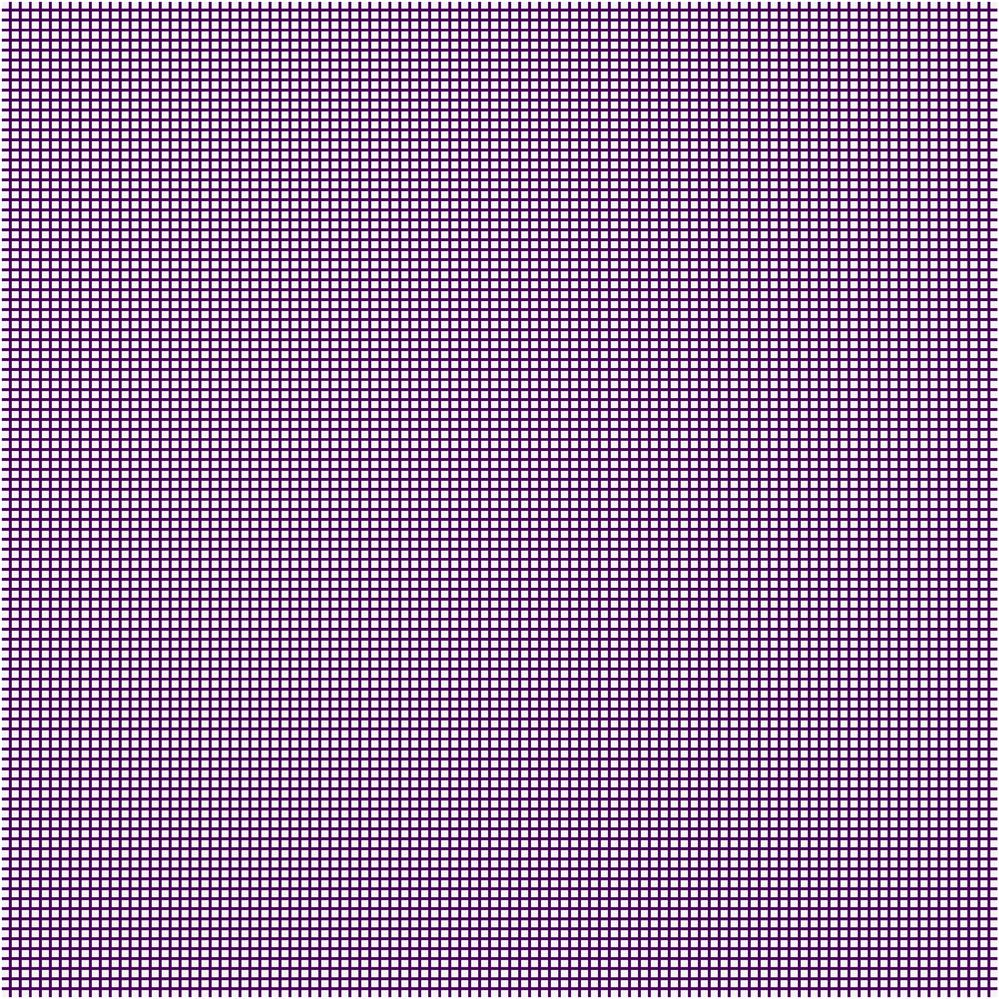

Epoch 0


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:29: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


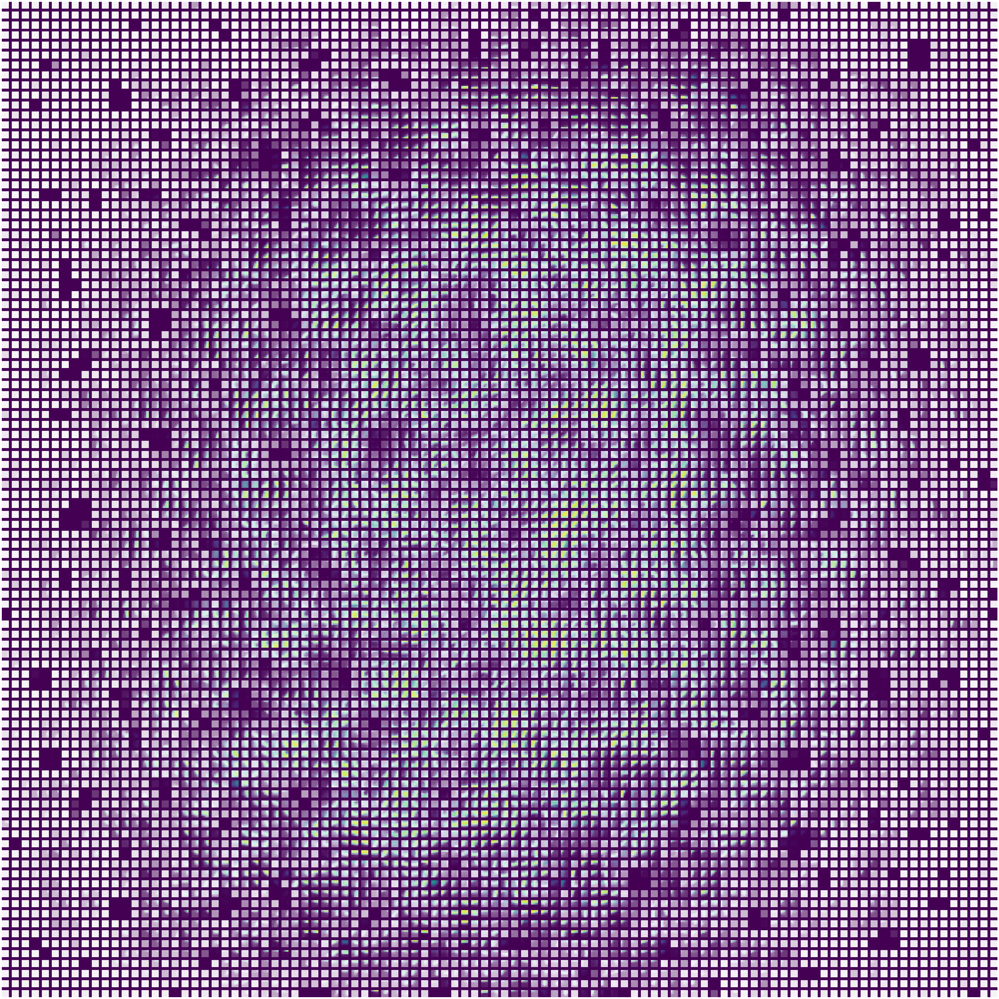

Epoch 1


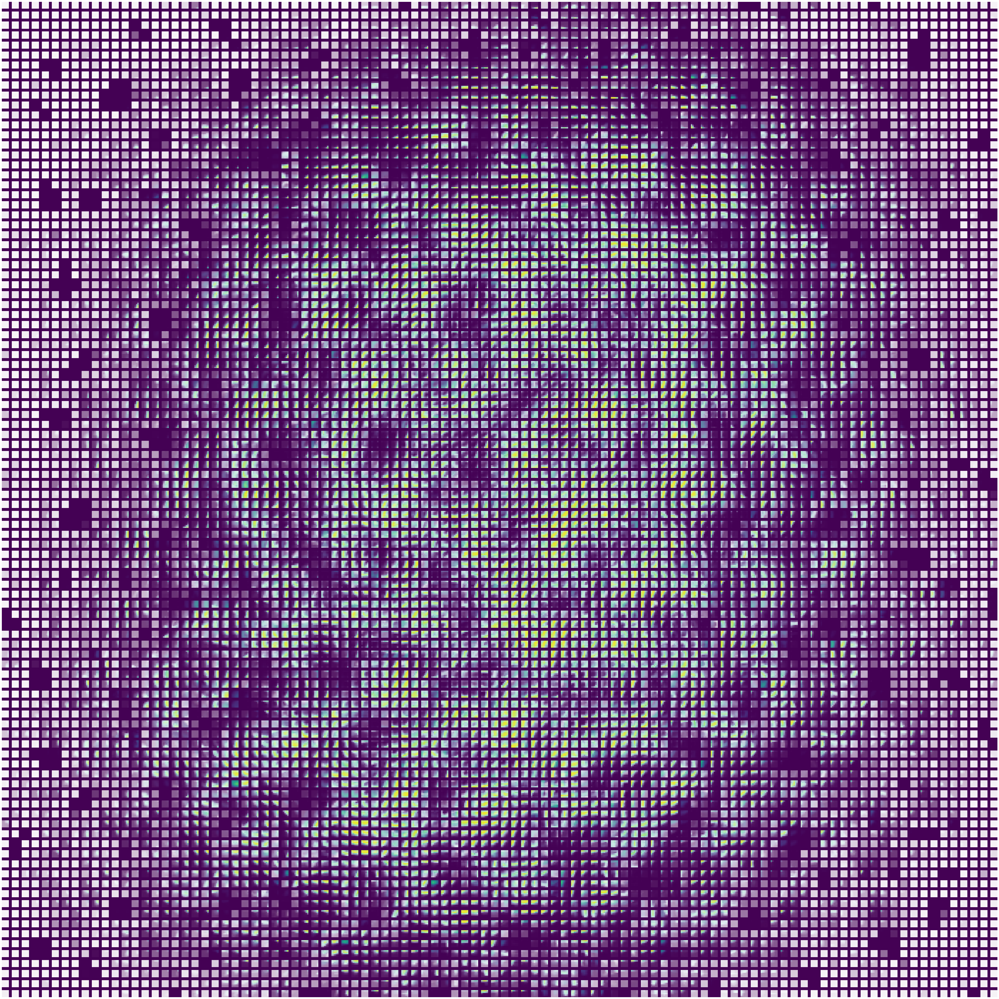

Epoch 2


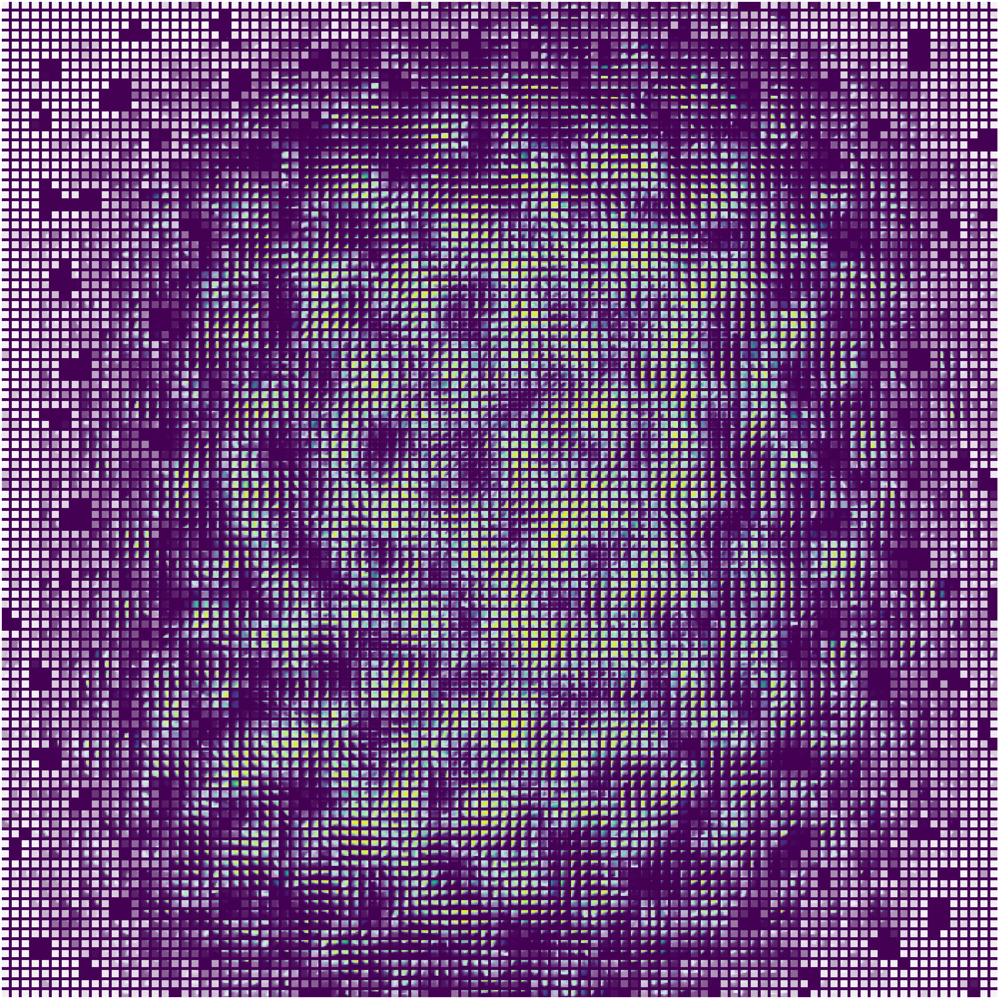

Epoch 3


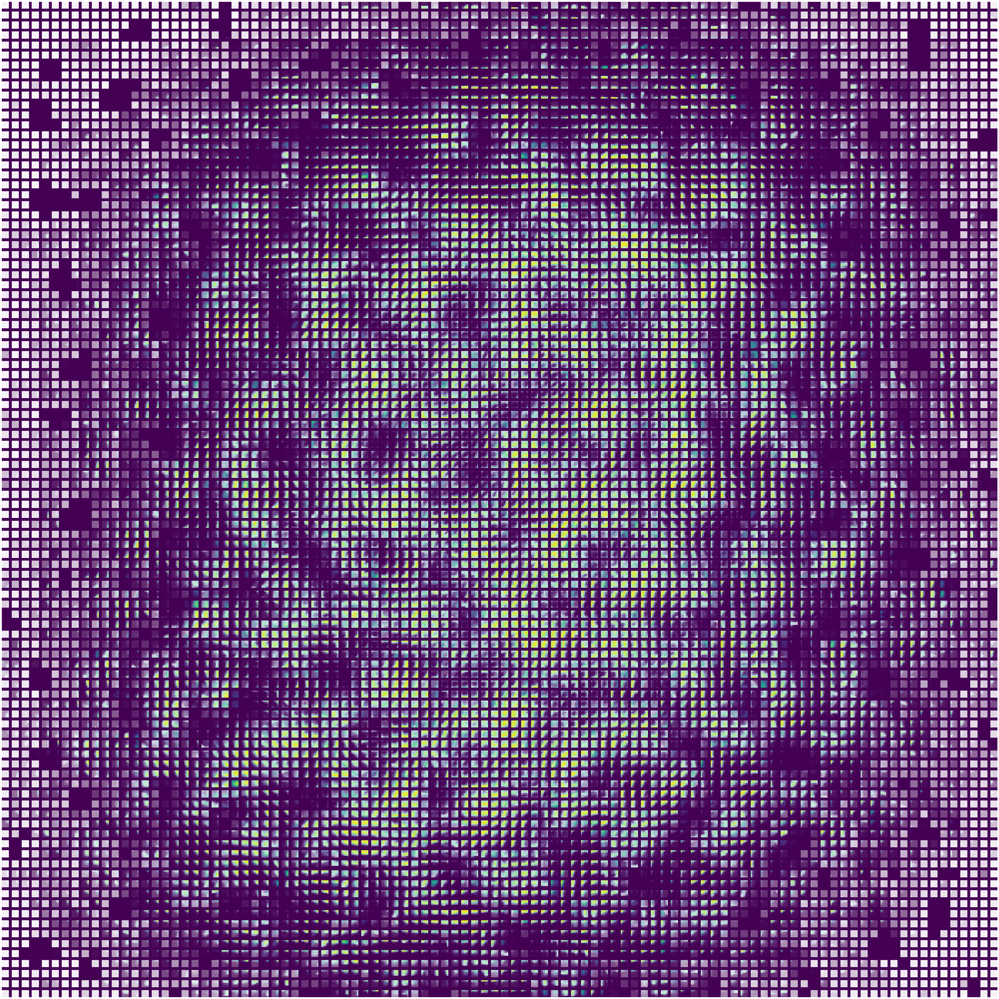

In [8]:
%aimport som_layer
import torch
from som_layer import SOMLayer
from hp import LayerHP
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt

layer_hp = LayerHP()
layer_hp.input_shape = dataset_hp.kernel_shape
layer_hp.patch_grid_shape = patch_grid_shape

patch_grid_shape = dataset_hp.patch_grid_shape
layer_hp.retinotopic_local_grid_shape = (
    int(layer_hp.target_output_usage_factor * layer_hp.output_shape[0] / patch_grid_shape[0]),
    int(layer_hp.target_output_usage_factor * layer_hp.output_shape[1] / patch_grid_shape[1]),
)

print("retinotopic_local_grid_shape", layer_hp.retinotopic_local_grid_shape)

layer1 = SOMLayer(layer_hp)

def run(epochs=8):
  # dataset_precision = None

  for i in range(epochs):
    print("Epoch", i)
    # dataset = Util.add_gaussian_noise(original_dataset, std=noise)

    for batch in tqdm(iter(original_dataset), "Image"):
      assert len(batch) == 1, "Process all patches for a single image"
      output = layer1(batch[0][0])
      # plt.imshow(output)
      # plt.show()

    layer1.show_weights()
    # layer1.show_precision()

    # layer1.predict(original_dataset, dataset_precision)

    # if (i+1) % int(epochs / 2) == 0:
    #   GraphicsUtil.show_image_grid(layer1.patterns.view(-1, HP.image_height, HP.image_width), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
    #   GraphicsUtil.show_image_grid(torch.exp(-layer1.pattern_var.view(-1, HP.image_height, HP.image_width) * HP.mask_contrast), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
      # GraphicsUtil.show_image_grid(dataset.view(-1, HP.image_height, HP.image_width))

    # GraphicsUtil.show_image_grid(layer1.patterns.view(-1, HP.image_height, HP.image_width), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
    # GraphicsUtil.show_image_grid(torch.exp(-layer1.pattern_var.view(-1, HP.image_height, HP.image_width) * HP.mask_contrast), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
    # GraphicsUtil.show_most_precise_patterns(layer1.weights, layer1.precision)


# %lprun -f run -m pattern_memory_layer run(epochs=5)
run(epochs=4)

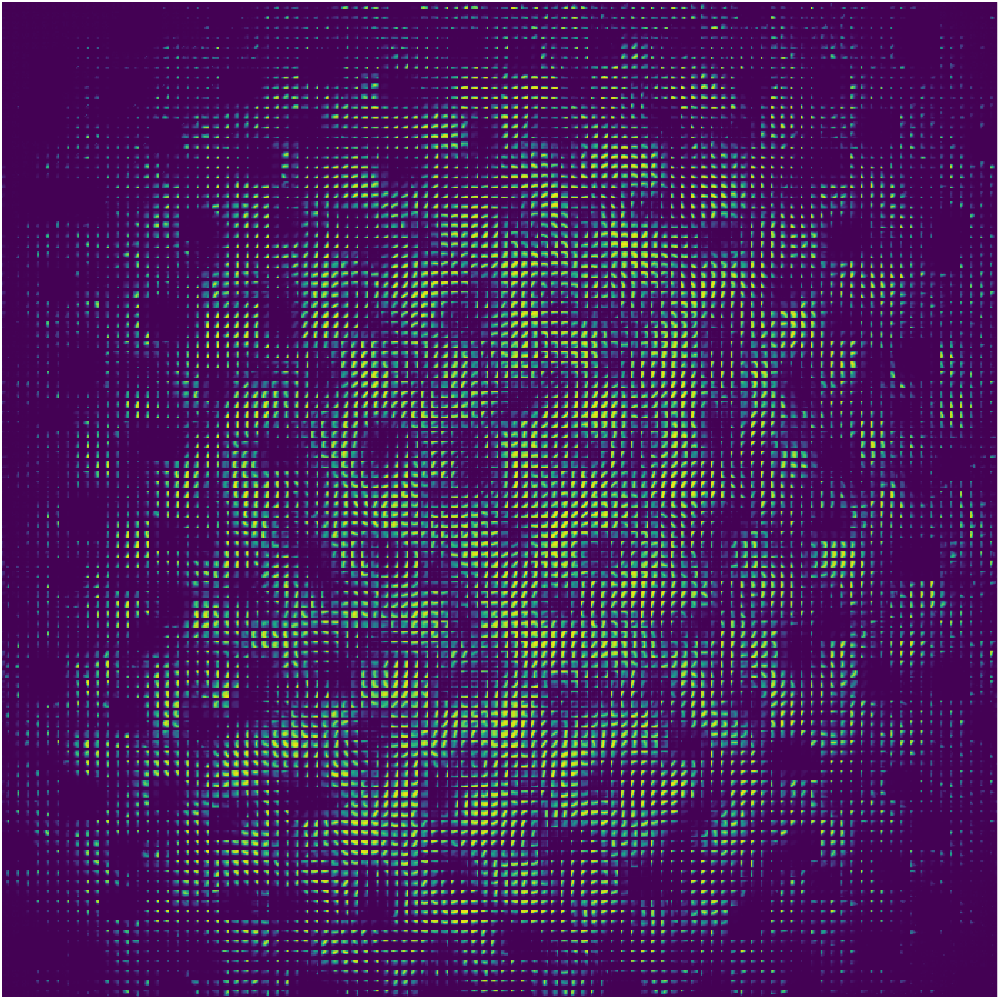

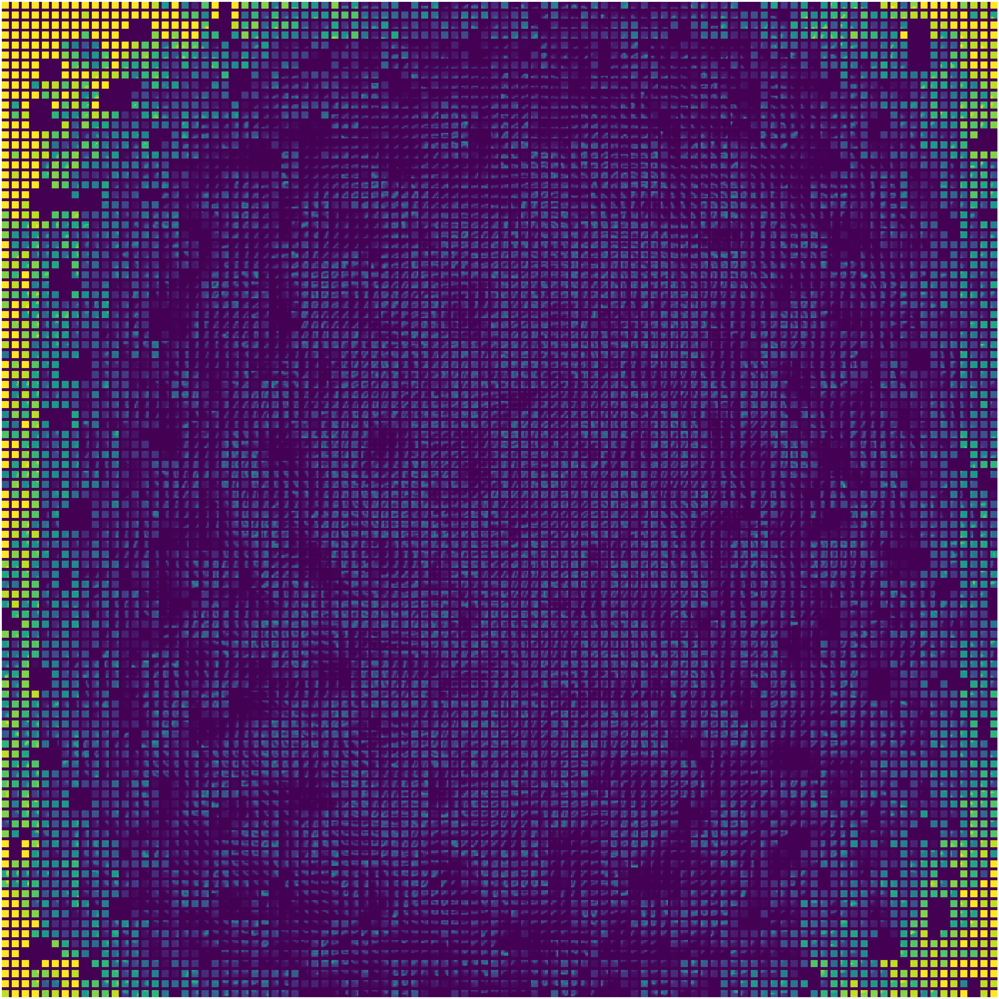

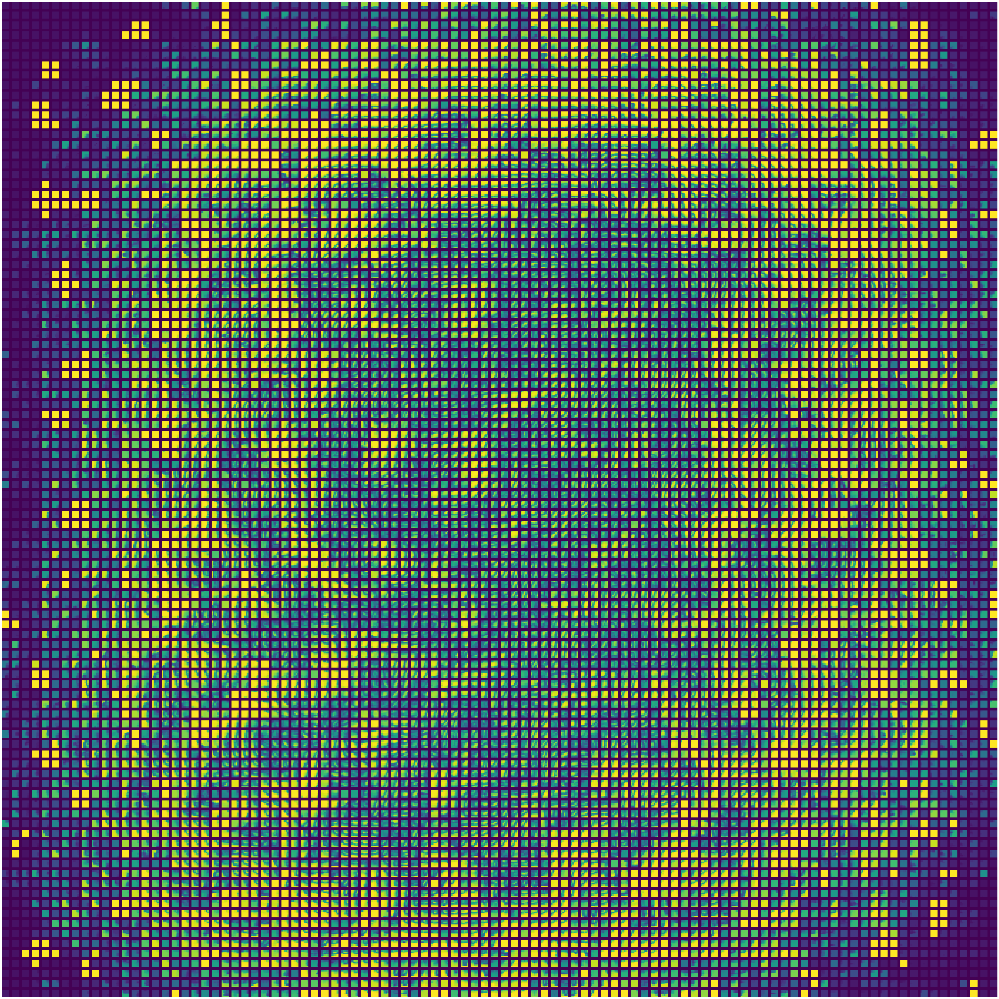

In [9]:
GraphicsUtil.show_image_grid(layer1.weights.view(-1, layer1.hp.input_shape[0], layer1.hp.input_shape[1]), grid_height=layer1.hp.output_shape[0], grid_width=layer1.hp.output_shape[1])
GraphicsUtil.show_image_grid(layer1.variance.view(-1, layer1.hp.input_shape[0], layer1.hp.input_shape[1]), grid_height=layer1.hp.output_shape[0], grid_width=layer1.hp.output_shape[1])
GraphicsUtil.show_image_grid(layer1.precision.view(-1, layer1.hp.input_shape[0], layer1.hp.input_shape[1]), grid_height=layer1.hp.output_shape[0], grid_width=layer1.hp.output_shape[1], vmin=0, vmax=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


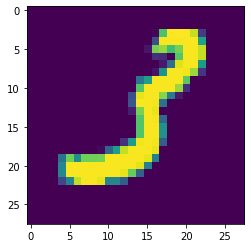

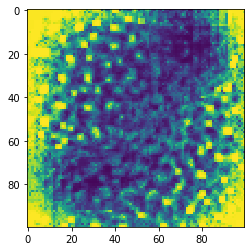

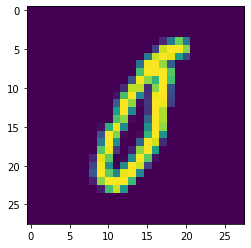

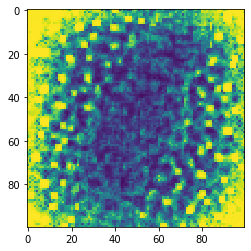

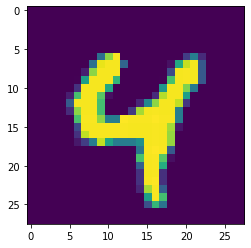

...

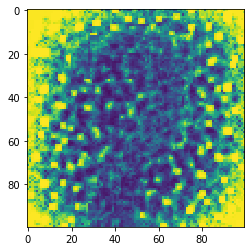

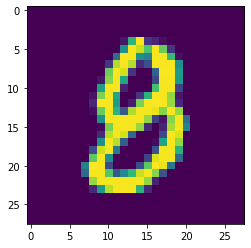

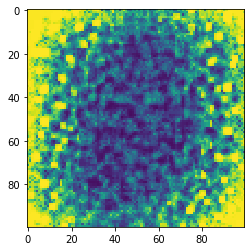

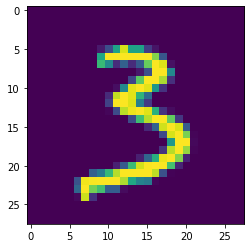

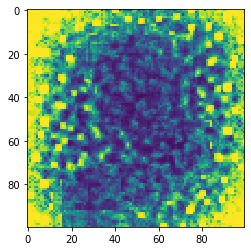


400 images of size  torch.Size([100, 100])


In [10]:
layer1_output = []
for i in tqdm(range(original_images.shape[0])):
    patches = original_dataset.dataset.tensors[0][i]

    if i < 10:
        image = original_images[i]
        plt.imshow(image, vmin=0, vmax=1, interpolation='none', cmap=plt.cm.viridis)
        plt.show()
        
    output = layer1(patches)
    layer1_output.append(output)
    
    if i < 10:
        plt.imshow(output, vmin=0, vmax=1, interpolation='none', cmap=plt.cm.viridis)
        plt.show()
        
print(len(layer1_output), "images of size ", layer1_output[0].shape)

{'image_batch_size': 400, 'kernel_shape': (5, 5), 'stride': 3}
images torch.Size([400, 1, 100, 100])
images torch.Size([400, 100, 100])


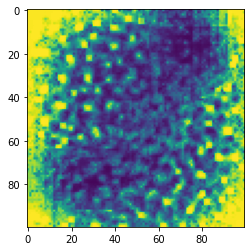

images torch.Size([400, 1, 100, 100])
patches torch.Size([400, 1024, 25])
patch_grid_shape (32, 32)


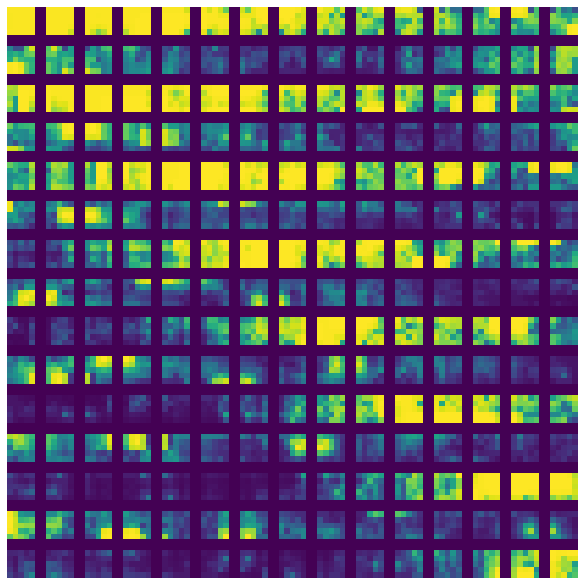

In [11]:
from hp import DatasetHP
from graphics_util import GraphicsUtil
from util import Util
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')


def load_dataset_layer2(config, images):
  # plt.imshow(images[0].permute(1,2,0))
  # plt.show()
  images = images[:,0,:,:].unsqueeze(1)
  ib, ic, ih, iw = images.shape
  config.image_shape = (ih, iw)
  print("images", images.shape)
  images = images.view(ib*ic, ih, iw)
  print("images", images.shape)

  plt.imshow(images[0], vmin=0, vmax=1)
  plt.show()

  patches = Util.conv_slice(images, kernel_shape=config.kernel_shape, stride=config.stride)
  print("patches", patches.shape)
  patch_grid_shape = config.patch_grid_shape
  print("patch_grid_shape", patch_grid_shape)
  assert patch_grid_shape[0] * patch_grid_shape[1] == patches.shape[1]

  GraphicsUtil.show_image_grid(patches.reshape(-1, config.kernel_shape[0], config.kernel_shape[0]))

  dataset = torch.utils.data.TensorDataset(patches.to(device))
  
  loader = torch.utils.data.DataLoader(dataset, batch_size=1, pin_memory=False)
  return loader, images, patch_grid_shape


dataset_hp_layer2 = DatasetHP()
# dataset_hp_layer2.kernel_shape = (5, 5)
dataset_hp_layer2.stride = 3
print(vars(dataset_hp_layer2))
images_layer2 = torch.stack(layer1_output).unsqueeze(1)
original_dataset_layer2, original_images_layer2, patch_grid_shape_layer2 = load_dataset_layer2(config=dataset_hp_layer2, images=images_layer2)


retinotopic_local_grid_shape for layer2 (4, 4)


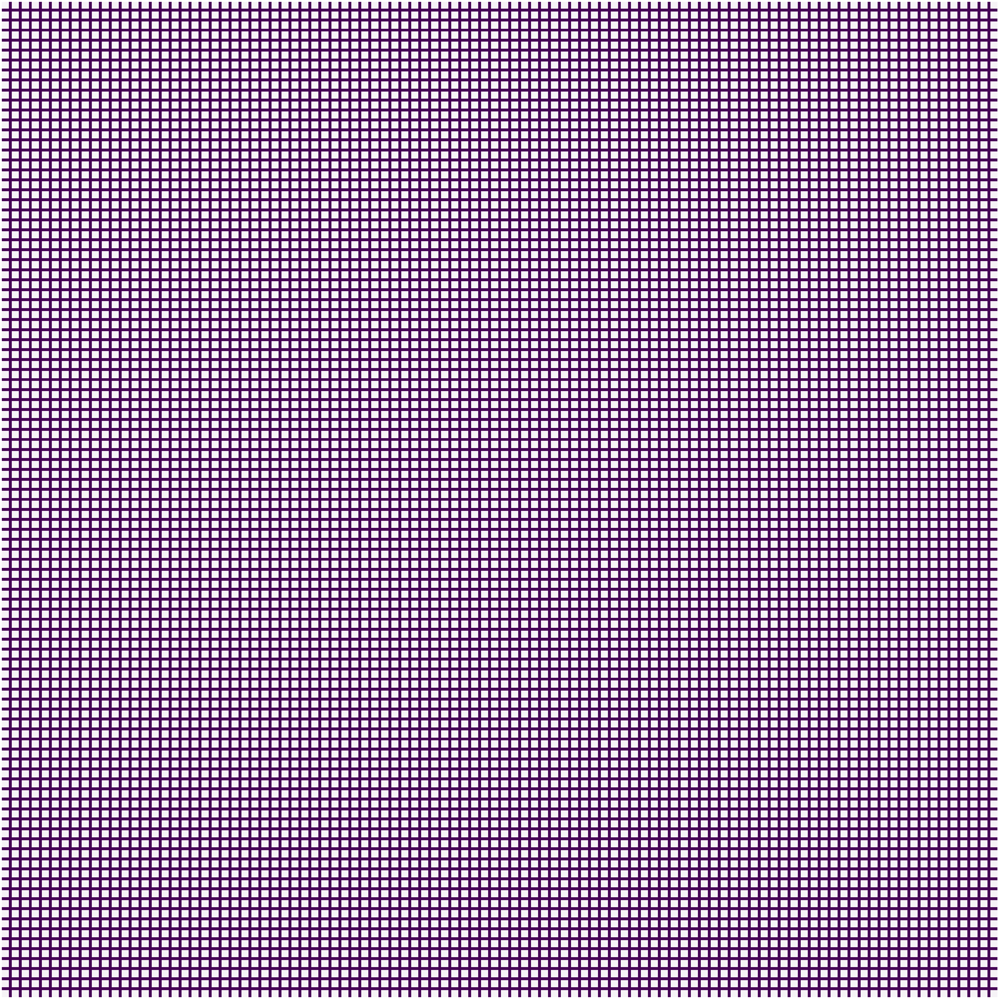

Epoch 0


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:31: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


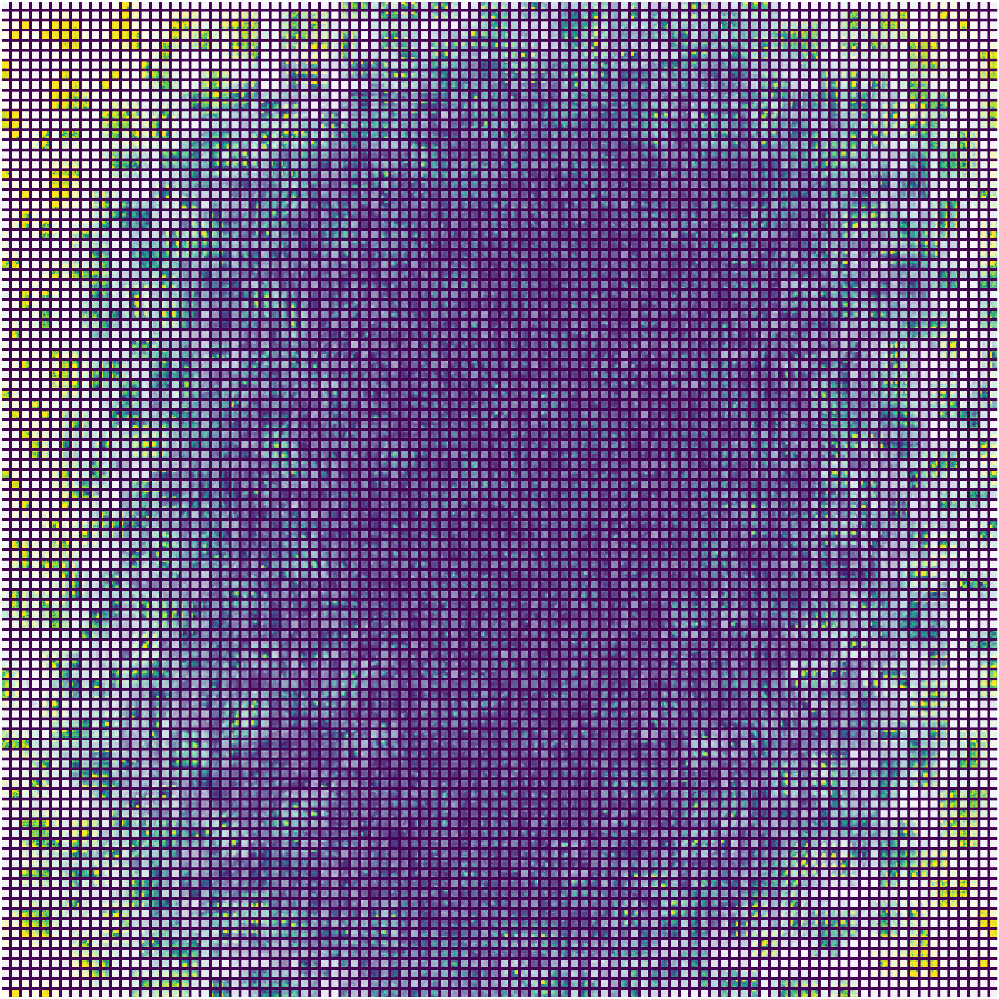

Epoch 1


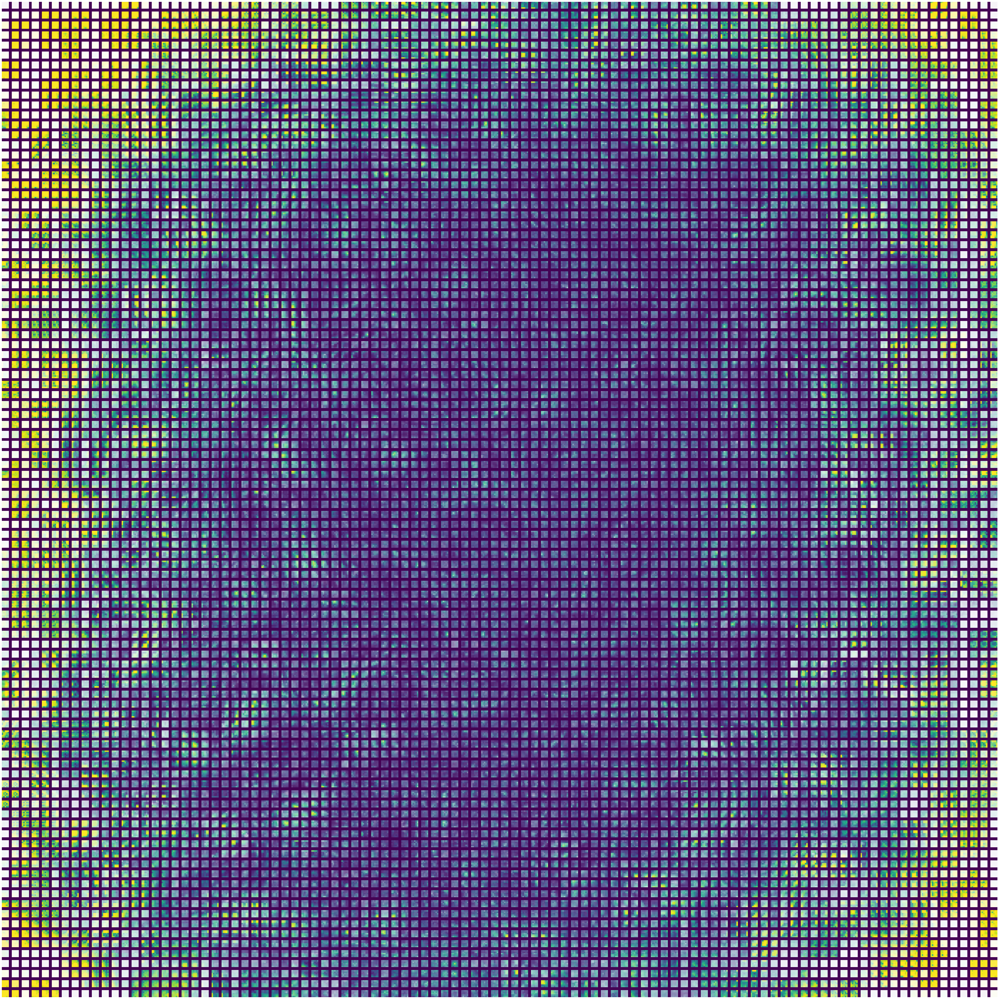

Epoch 2


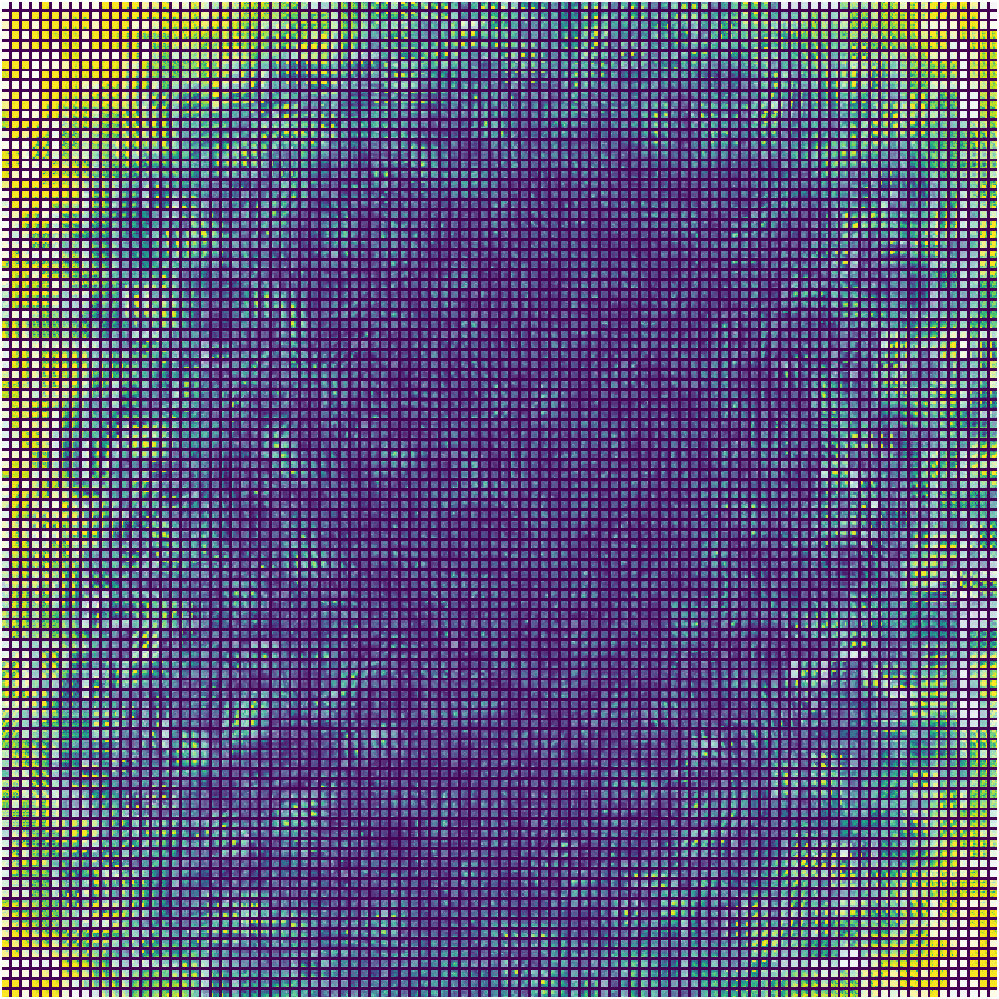

Epoch 3


In [ ]:
import torch
from som_layer import SOMLayer
from hp import LayerHP
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt

hp_layer2 = LayerHP()
hp_layer2.input_shape = dataset_hp_layer2.kernel_shape
hp_layer2.output_shape = (100, 100)
hp_layer2.patch_grid_shape = patch_grid_shape_layer2
hp_layer2.target_output_usage_factor = 1.5
# hp_layer2.enable_retinotopy = True

patch_grid_shape_layer2 = dataset_hp_layer2.patch_grid_shape
hp_layer2.retinotopic_local_grid_shape = (
    int(hp_layer2.target_output_usage_factor * hp_layer2.output_shape[0] / patch_grid_shape_layer2[0]),
    int(hp_layer2.target_output_usage_factor * hp_layer2.output_shape[1] / patch_grid_shape_layer2[1]),
)

print("retinotopic_local_grid_shape for layer2", hp_layer2.retinotopic_local_grid_shape)

layer2 = SOMLayer(hp_layer2)

def run(epochs=8):
  # dataset_precision = None

  for i in range(epochs):
    print("Epoch", i)
    # dataset = Util.add_gaussian_noise(original_dataset, std=noise)

    for batch in tqdm(iter(original_dataset_layer2), "Image"):
      assert len(batch) == 1, "Process all patches for a single image"
      output = layer2(batch[0][0])
      # plt.imshow(output)
      # plt.show()

    layer2.show_weights()
    # layer1.show_precision()

    # layer1.predict(original_dataset, dataset_precision)

    # if (i+1) % int(epochs / 2) == 0:
    #   GraphicsUtil.show_image_grid(layer1.patterns.view(-1, HP.image_height, HP.image_width), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
    #   GraphicsUtil.show_image_grid(torch.exp(-layer1.pattern_var.view(-1, HP.image_height, HP.image_width) * HP.mask_contrast), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
      # GraphicsUtil.show_image_grid(dataset.view(-1, HP.image_height, HP.image_width))

    # GraphicsUtil.show_image_grid(layer1.patterns.view(-1, HP.image_height, HP.image_width), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
    # GraphicsUtil.show_image_grid(torch.exp(-layer1.pattern_var.view(-1, HP.image_height, HP.image_width) * HP.mask_contrast), grid_width=HP.pattern_grid_width, grid_height=HP.pattern_grid_height)
    # GraphicsUtil.show_most_precise_patterns(layer1.weights, layer1.precision)


# %lprun -f run -m pattern_memory_layer run(epochs=5)
run(epochs=4)

In [ ]:
GraphicsUtil.show_image_grid(layer2.weights.view(-1, layer2.hp.input_shape[0], layer2.hp.input_shape[1]), grid_height=layer2.hp.output_shape[0], grid_width=layer2.hp.output_shape[1])
GraphicsUtil.show_image_grid(layer2.variance.view(-1, layer2.hp.input_shape[0], layer2.hp.input_shape[1]), grid_height=layer2.hp.output_shape[0], grid_width=layer2.hp.output_shape[1])
GraphicsUtil.show_image_grid(layer2.precision.view(-1, layer2.hp.input_shape[0], layer2.hp.input_shape[1]), grid_height=layer2.hp.output_shape[0], grid_width=layer2.hp.output_shape[1], vmin=0, vmax=1)

In [ ]:
layer2_output = []
for i in range(10): #tqdm(range(original_images_layer2.shape[0])):
    patches = original_dataset_layer2.dataset.tensors[0][i]

    if i < 10:
        image = original_images[i]
        plt.imshow(image, vmin=0, vmax=1, interpolation='none', cmap=plt.cm.viridis)
        plt.show()

        image = original_images_layer2[i]
        plt.imshow(image, vmin=0, vmax=1, interpolation='none', cmap=plt.cm.viridis)
        plt.show()
        
    output = Util.norm_scale(layer2(patches))
    layer2_output.append(output)
    
    if i < 10:
        plt.imshow(output, vmin=0, vmax=1, interpolation='none', cmap=plt.cm.viridis)
        plt.show()
        
print(len(layer2_output), "images of size ", layer2_output[0].shape)